In [ ]:
!pip install captum

  Using cached captum-0.7.0-py3-none-any.whl (1.3 MB)
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/My Drive/xai"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/xai


In [ ]:
!wget -P "/content/drive/My Drive/xai" https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json
!wget -nd -r -P "/content/drive/My Drive/xai" -A jpeg,jpg,bmp,gif,png https://upload.wikimedia.org/wikipedia/commons/thumb/2/26/YellowLabradorLooking_new.jpg/640px-YellowLabradorLooking_new.jpg

--2024-06-10 12:15:39--  https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.219.112, 3.5.22.38, 52.217.89.198, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.219.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35363 (35K) [application/octet-stream]
Saving to: ‘/content/drive/My Drive/xai/imagenet_class_index.json.3’

imagenet_class_inde 100%[===================>]  34.53K  --.-KB/s    in 0.02s   

2024-06-10 12:15:39 (1.41 MB/s) - ‘/content/drive/My Drive/xai/imagenet_class_index.json.3’ saved [35363/35363]

--2024-06-10 12:15:39--  https://upload.wikimedia.org/wikipedia/commons/thumb/2/26/YellowLabradorLooking_new.jpg/640px-YellowLabradorLooking_new.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent,

In [ ]:
import json
labels_path = '/content/drive/My Drive/xai/imagenet_class_index.json'
with open(labels_path) as json_data:
    idx_to_labels = json.load(json_data)
idx_to_labels

{'0': ['n01440764', 'tench'],
 '1': ['n01443537', 'goldfish'],
 '2': ['n01484850', 'great_white_shark'],
 '3': ['n01491361', 'tiger_shark'],
 '4': ['n01494475', 'hammerhead'],
 '5': ['n01496331', 'electric_ray'],
 '6': ['n01498041', 'stingray'],
 '7': ['n01514668', 'cock'],
 '8': ['n01514859', 'hen'],
 '9': ['n01518878', 'ostrich'],
 '10': ['n01530575', 'brambling'],
 '11': ['n01531178', 'goldfinch'],
 '12': ['n01532829', 'house_finch'],
 '13': ['n01534433', 'junco'],
 '14': ['n01537544', 'indigo_bunting'],
 '15': ['n01558993', 'robin'],
 '16': ['n01560419', 'bulbul'],
 '17': ['n01580077', 'jay'],
 '18': ['n01582220', 'magpie'],
 '19': ['n01592084', 'chickadee'],
 '20': ['n01601694', 'water_ouzel'],
 '21': ['n01608432', 'kite'],
 '22': ['n01614925', 'bald_eagle'],
 '23': ['n01616318', 'vulture'],
 '24': ['n01622779', 'great_grey_owl'],
 '25': ['n01629819', 'European_fire_salamander'],
 '26': ['n01630670', 'common_newt'],
 '27': ['n01631663', 'eft'],
 '28': ['n01632458', 'spotted_salama

In [ ]:
# Initial imports
import numpy as np
import torch

import torchvision
from torchvision import models
from torchvision import transforms

from captum.attr import IntegratedGradients, GradientShap, Occlusion, LayerGradCam
from captum.attr import visualization as viz
from captum.attr import NoiseTunnel

from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

(640, 528)


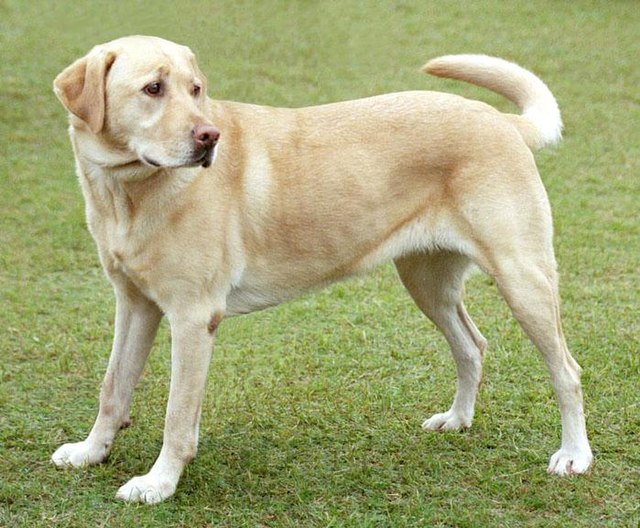

In [ ]:
img = Image.open('/content/drive/My Drive/xai/640px-YellowLabradorLooking_new.jpg')
print(img.size)
img

In [ ]:
transform = transforms.Compose([
 transforms.Resize(256),
 transforms.CenterCrop(224),
 transforms.ToTensor()
])

transform_normalize = transforms.Normalize(
     mean=[0.485, 0.456, 0.406],
     std=[0.229, 0.224, 0.225]
 )

transformed_img = transform(img)

input = transform_normalize(transformed_img)
input = input.unsqueeze(0)

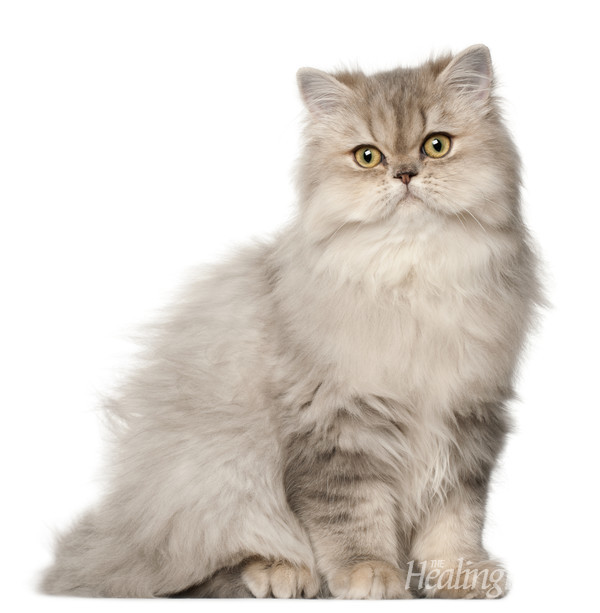

In [ ]:
img = Image.open('/content/drive/MyDrive/xai_resnet_cat/data/persian.jpg')

transformed_img = transform(img)
input = transform_normalize(transformed_img)
input = input.unsqueeze(0)

img

In [ ]:
timesteps = 100    # how many steps for a noisy image into clear
time_bar = 1 - np.linspace(0, 1.0, timesteps + 1) # linspace for timesteps
print(time_bar)

[1.   0.99 0.98 0.97 0.96 0.95 0.94 0.93 0.92 0.91 0.9  0.89 0.88 0.87
 0.86 0.85 0.84 0.83 0.82 0.81 0.8  0.79 0.78 0.77 0.76 0.75 0.74 0.73
 0.72 0.71 0.7  0.69 0.68 0.67 0.66 0.65 0.64 0.63 0.62 0.61 0.6  0.59
 0.58 0.57 0.56 0.55 0.54 0.53 0.52 0.51 0.5  0.49 0.48 0.47 0.46 0.45
 0.44 0.43 0.42 0.41 0.4  0.39 0.38 0.37 0.36 0.35 0.34 0.33 0.32 0.31
 0.3  0.29 0.28 0.27 0.26 0.25 0.24 0.23 0.22 0.21 0.2  0.19 0.18 0.17
 0.16 0.15 0.14 0.13 0.12 0.11 0.1  0.09 0.08 0.07 0.06 0.05 0.04 0.03
 0.02 0.01 0.  ]


In [ ]:
def show_examples2(x):
    x = x.cpu().detach().numpy()
    x = (x - x.min()) / (x.max() - x.min())
    plt.figure(figsize=(50, 10))
    for i in range(100):
        plt.subplot(5, 20, i + 1)
        plt.imshow(np.transpose(x[i], (1, 2, 0)))
        plt.axis('off')
    plt.show()

In [ ]:
def forward_noise(x, t):
    a = time_bar[t]
    b = time_bar[t + 1]
    noise = torch.randn_like(x)
    print(a.shape)
    a = a.reshape(-1, 1, 1, 1)
    b = b.reshape(-1, 1, 1, 1)
    img_a = x * (1 - a) + noise * a
    img_b = x * (1 - b) + noise * b
    return torch.tensor(img_a), torch.tensor(img_b)

def generate_ts(num):
    return torch.tensor(np.random.randint(0, timesteps, size=num))

(100,)


<ipython-input-13-1cc84919cfce>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(img_a), torch.tensor(img_b)


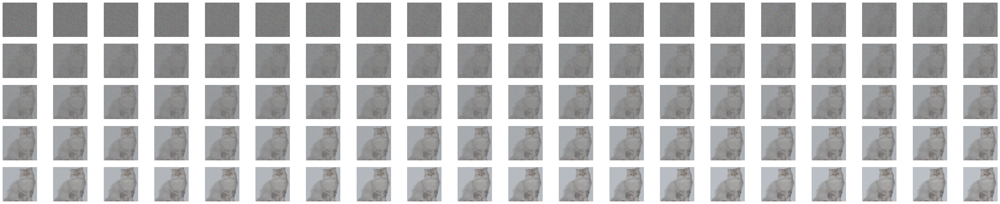

torch.Size([100, 3, 224, 224])


In [ ]:
# 1번 timestep, 2번 time step, 3번 time step
noisy_per_time= []

t = torch.arange(100)
a, b = forward_noise(input, t)
show_examples2(a)
print(a.shape)

In [ ]:
print(a.shape)
print(input.shape)

torch.Size([100, 3, 224, 224])
torch.Size([1, 3, 224, 224])


In [ ]:
model = models.resnet18(pretrained=True)
model = model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 75.1MB/s]


torch.Size([1, 3, 224, 224])


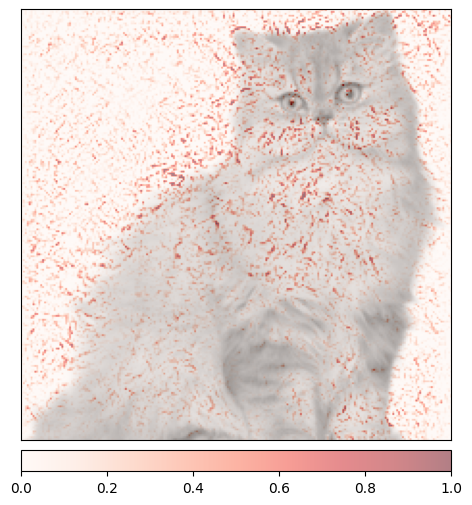

(<Figure size 600x600 with 2 Axes>, <Axes: >)

In [ ]:
TARGET_LABEL_IDX = 283  # 페르시안 고양이 클래스
pickone = a[99].unsqueeze(0)
print(pickone.shape)
ZERO = torch.zeros(pickone.shape)

ig = IntegratedGradients(model)
attributions_ig = ig.attribute(pickone.to(dtype=torch.float32),
                               target=TARGET_LABEL_IDX,
                               n_steps=20,
                               baselines=ZERO,)
attributions_ig = np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1, 2, 0))
input_img = np.transpose(pickone.squeeze().cpu().detach().numpy(), (1, 2, 0))

viz.visualize_image_attr(attributions_ig,
                            input_img,
                            method="blended_heat_map",
                            cmap="Reds",
                            show_colorbar=True,
                            sign="positive",
                            outlier_perc=5
                            )

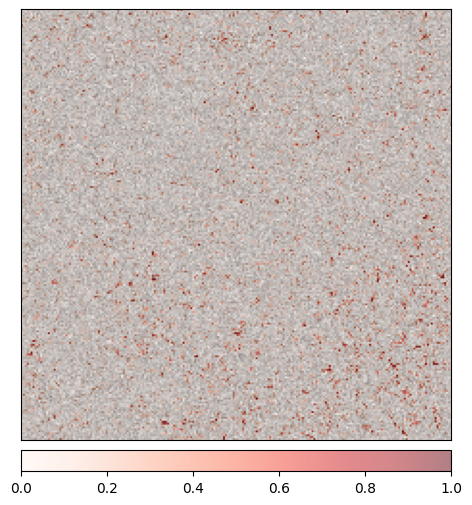

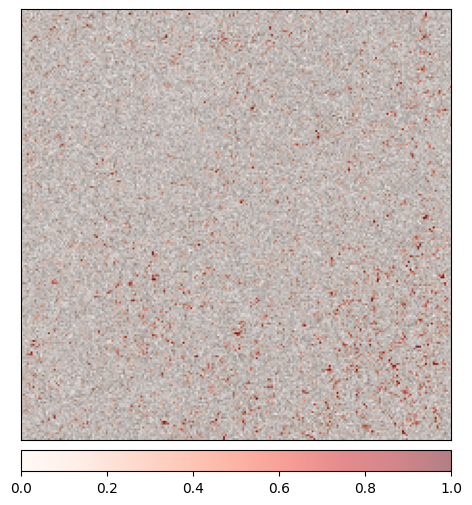

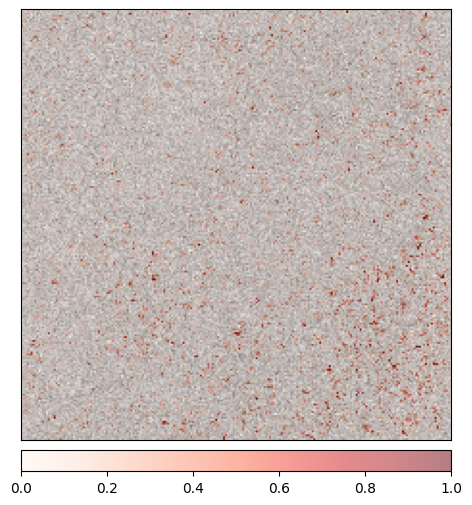

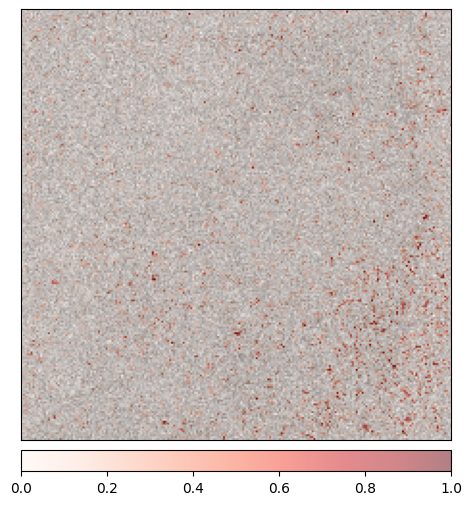

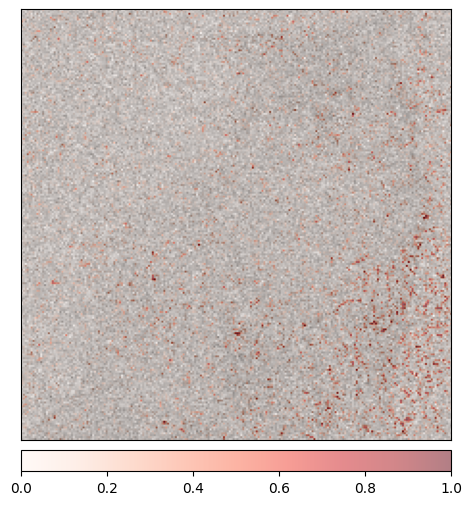

...

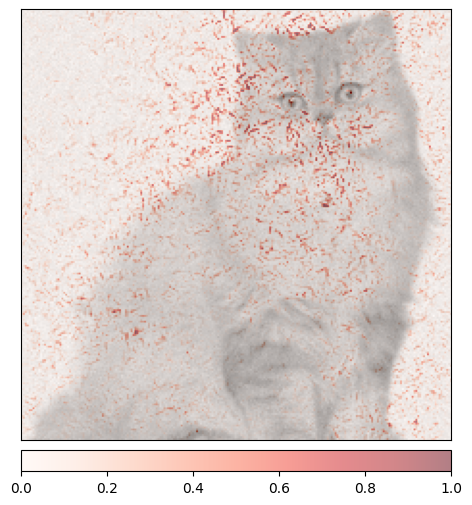

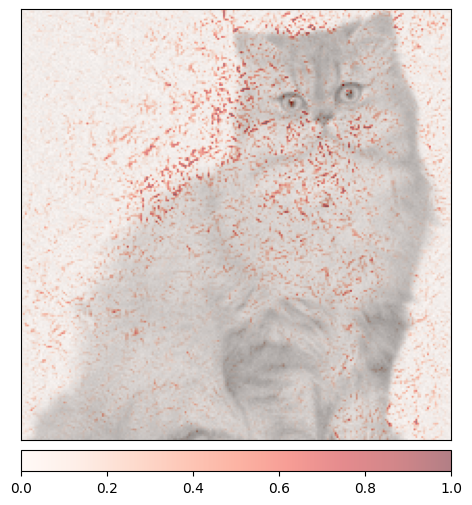

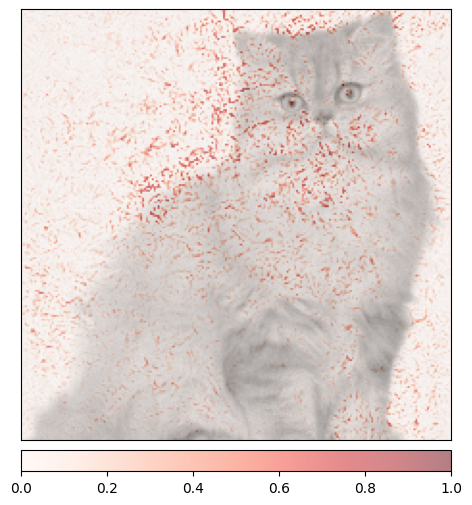

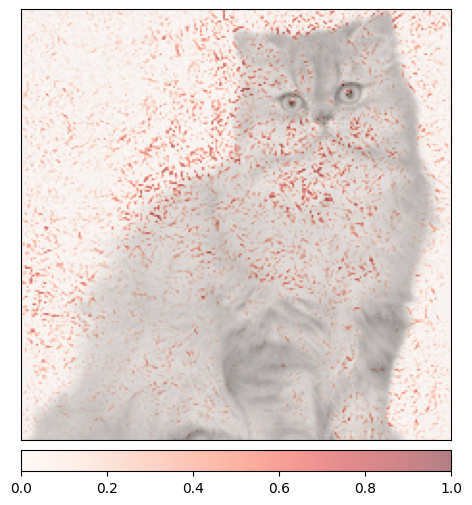

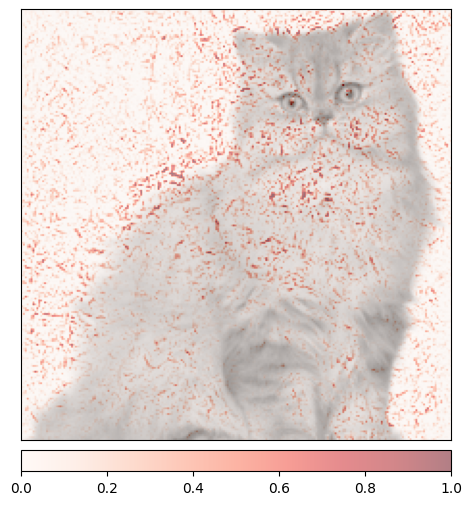

In [ ]:
TARGET_LABEL_IDX = 283

# fig, axes = plt.subplots(5, 5, figsize=(20, 20))

for i in range(0, len(a), 4):  # 4의 배수로 인덱스를 설정
    # row = i // 20
    # col = (i % 20) // 4
    # print(row, col)
    pickone = a[i].unsqueeze(0)
    ZERO = torch.zeros(pickone.shape)  # 각 이미지에 대한 baseline 생성
    ig = IntegratedGradients(model)
    attributions_ig = ig.attribute(pickone.to(dtype=torch.float32),
                                target=TARGET_LABEL_IDX,
                                n_steps=20,
                                baselines=ZERO)
    attributions_ig = np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1, 2, 0))
    input_img = np.transpose(pickone.squeeze().cpu().detach().numpy(), (1, 2, 0))

    viz.visualize_image_attr(attributions_ig,
                            input_img,
                            method="blended_heat_map",
                            cmap="Reds",
                            show_colorbar=True,
                            sign="positive",
                            outlier_perc=5,
                            # fig_size=(3, 3),
                            # plt_fig_axis=(fig, axes[row, col]))
                            )
    # axes[row, col].axis('off')

# plt.tight_layout()
# plt.show()
